In [1]:
from nd2reader import ND2Reader
from nd2reader.parser import Parser
import matplotlib.pyplot as plt
import numpy as np
import tifffile as tif
from colicoords import Data, Cell, CellPlot
import cv2
from skimage import data
from skimage import io
import mahotas as mh

# Visualize Data

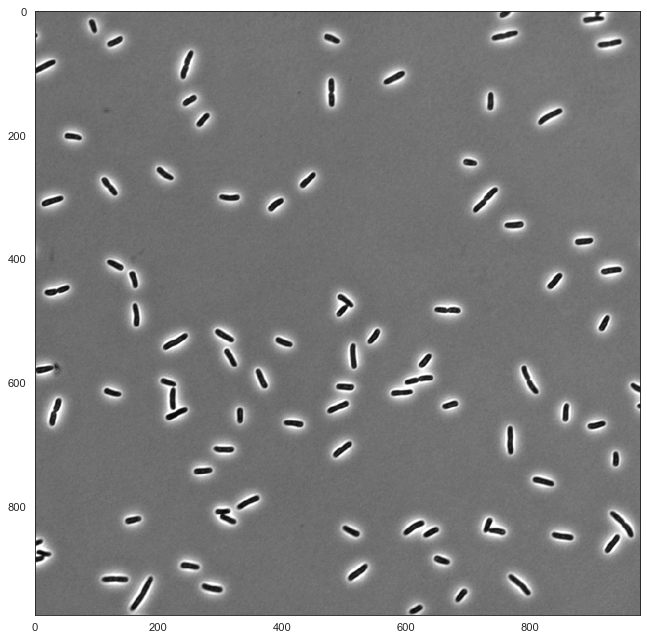

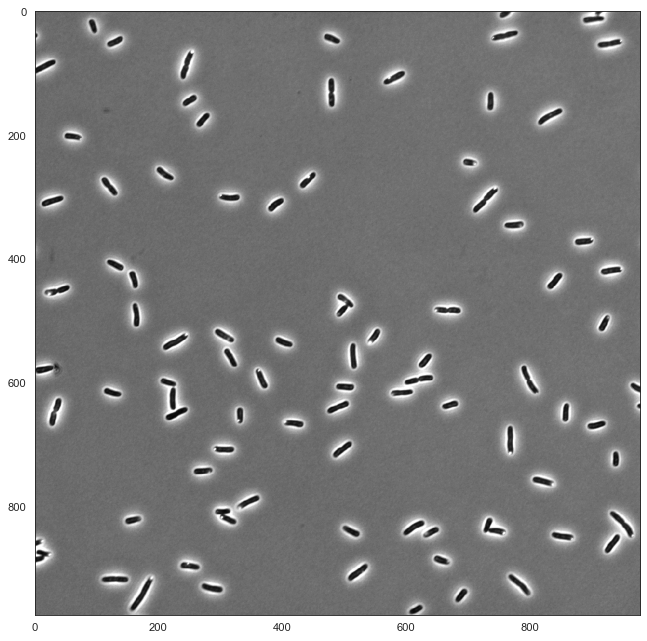

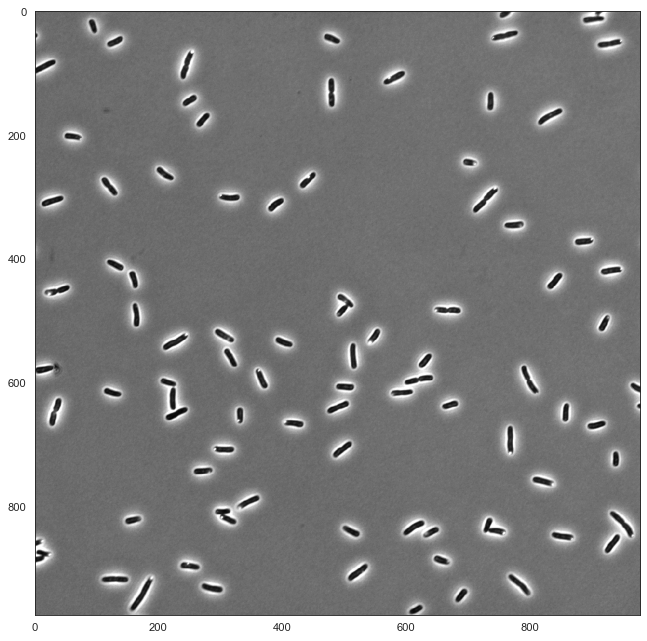

In [2]:
img=cv2.imread('resources/images/exploration/tif2.tif',-1)
for i in range(3):
    fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

    plt.imshow(img[:,:,i],cmap='gray')
    plt.show()

# Denoising

In [3]:
dst = cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)
dst

array([[[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [154, 157, 158],
        [154, 157, 158],
        [154, 157, 158]],

       [[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [152, 155, 156],
        [154, 157, 158],
        [154, 157, 158]],

       [[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [152, 155, 156],
        [152, 155, 156],
        [152, 155, 156]],

       ...,

       [[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [146, 149, 151],
        [146, 149, 151],
        [146, 149, 151]],

       [[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [146, 149, 151],
        [146, 149, 151],
        [146, 149, 151]],

       [[143, 146, 147],
        [143, 146, 147],
        [143, 146, 147],
        ...,
        [146, 149, 151],
        [146, 149, 151],
        [146, 149, 151]]

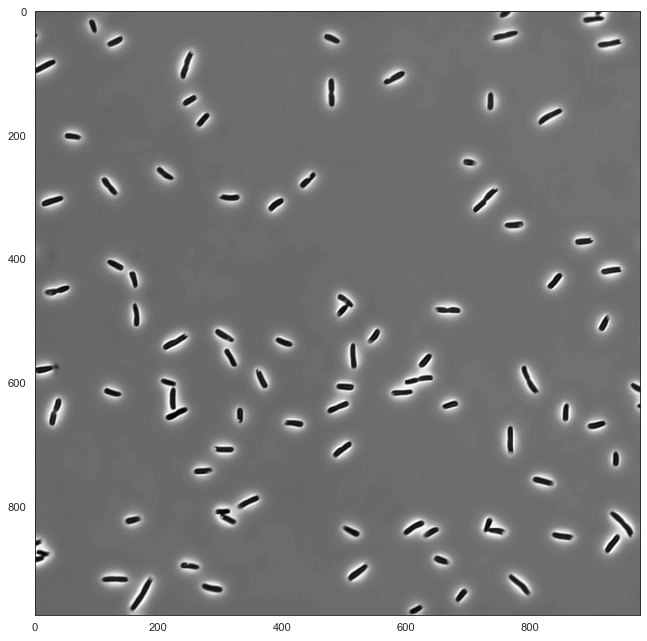

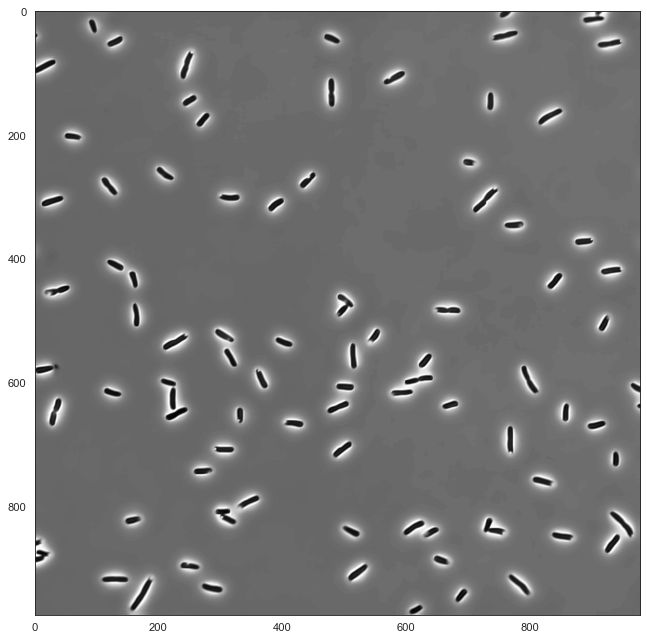

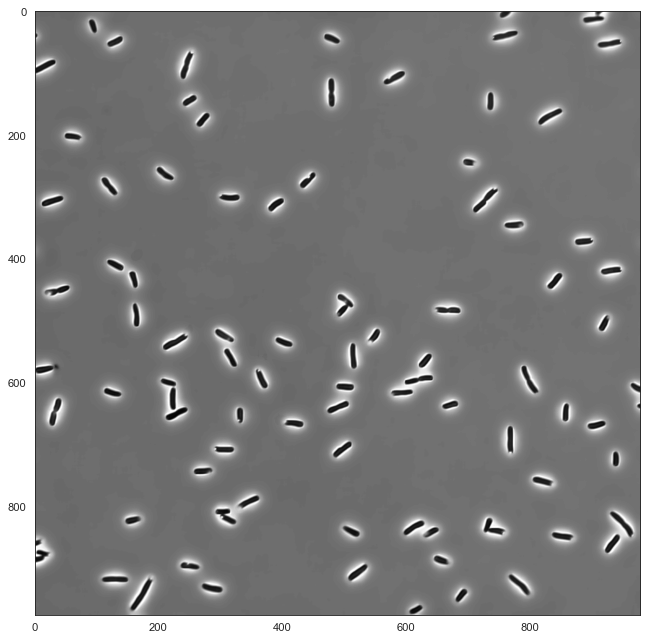

In [4]:
#cleand the images:
for i in range(3):
    fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

    plt.imshow(dst[:,:,i],cmap='gray')
    plt.show()

# Edge Detection

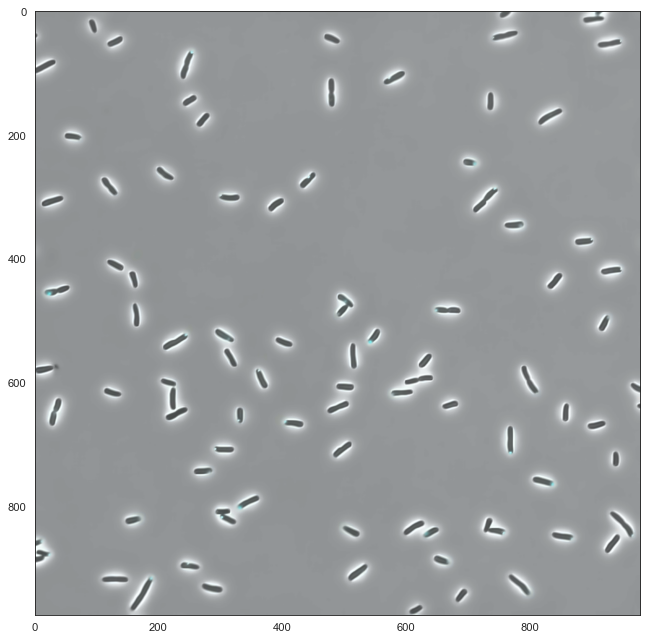

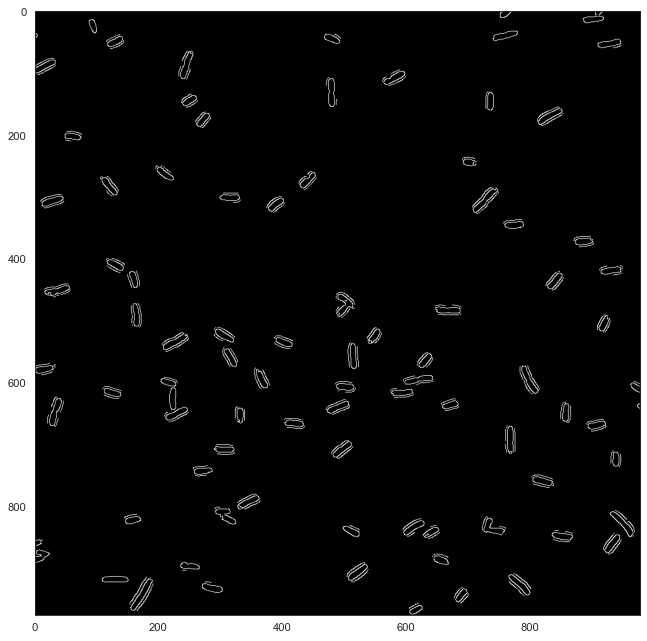

In [5]:
tc=dst.mean()
edgesc = cv2.Canny(dst,tc-25,tc+25)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(dst,cmap='gray')
# plt.subplot(121),plt.imshow(dst,cmap = 'gray')
# plt.title('Original Image'), plt.xticks([]), plt.yticks([])
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(edgesc,cmap='gray')
# plt.subplot(122),plt.imshow(edges,cmap = 'gray')
# plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

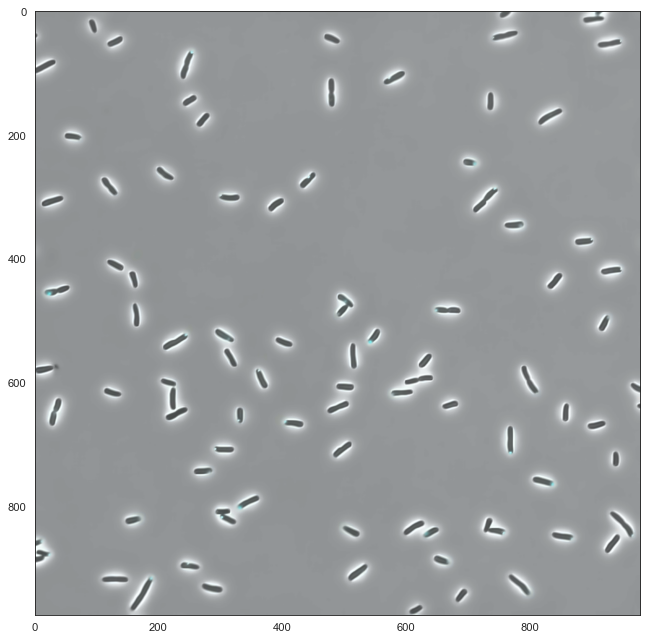

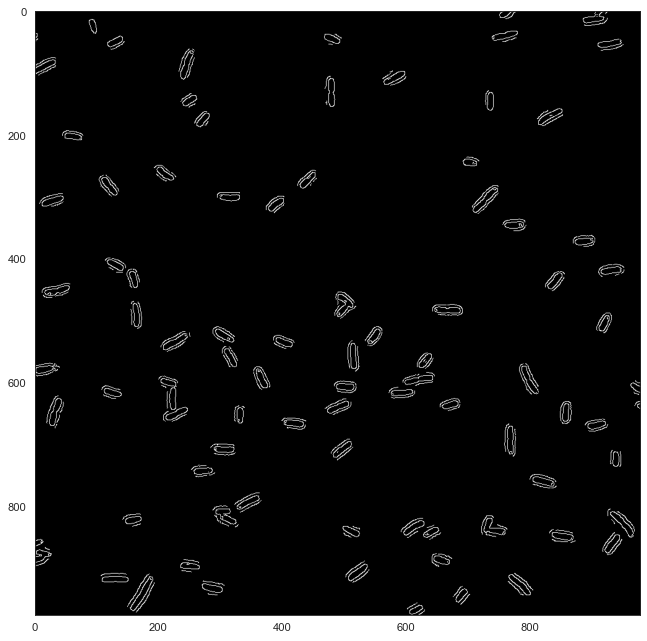

In [6]:
t=img.mean()
edges = cv2.Canny(img,t-25,t+25)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(dst,cmap='gray')
# plt.subplot(121),plt.imshow(dst,cmap = 'gray')
# plt.title('Original Image'), plt.xticks([]), plt.yticks([])
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(edges,cmap='gray')
# plt.subplot(122),plt.imshow(edges,cmap = 'gray')
# plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


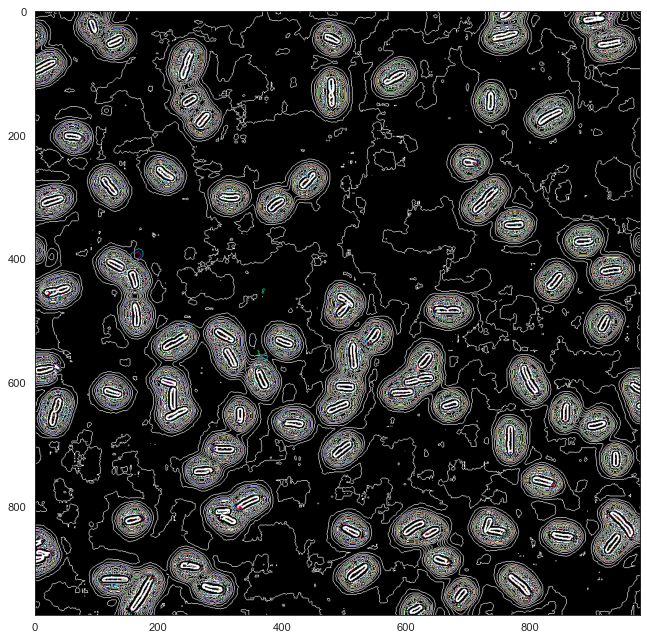

In [7]:
laplacian_img = cv2.Laplacian(img,cv2.CV_64F)
laplacian_dst = cv2.Laplacian(dst,cv2.CV_64F)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(laplacian_dst,cmap='gray')



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


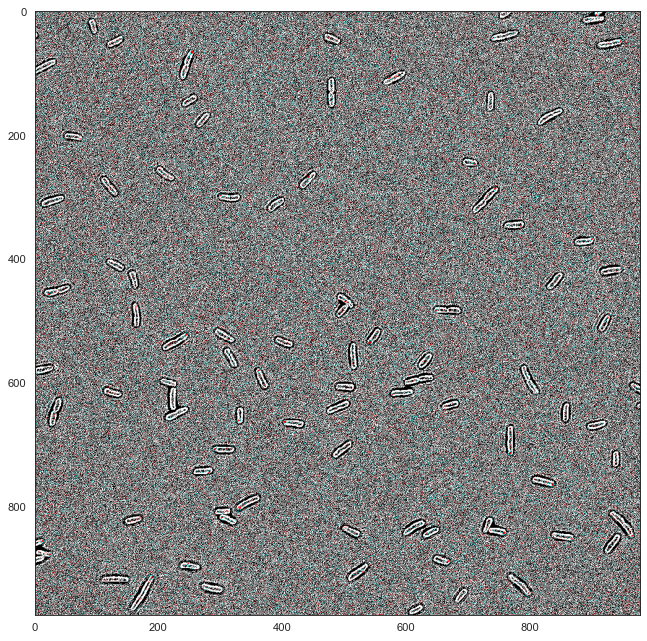

In [8]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(laplacian_img,cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


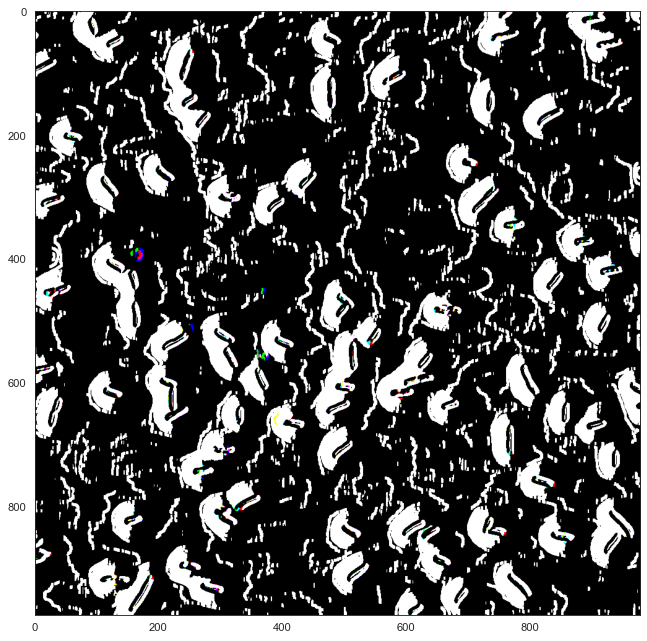

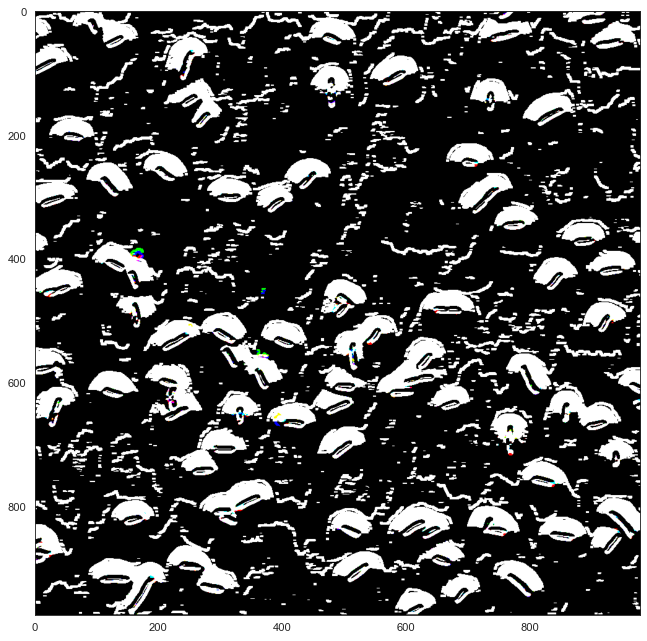

In [9]:
sobelxc = cv2.Sobel(dst,cv2.CV_64F,1,0,ksize=5)
sobelyc = cv2.Sobel(dst,cv2.CV_64F,0,1,ksize=5)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobelxc,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobelyc,cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


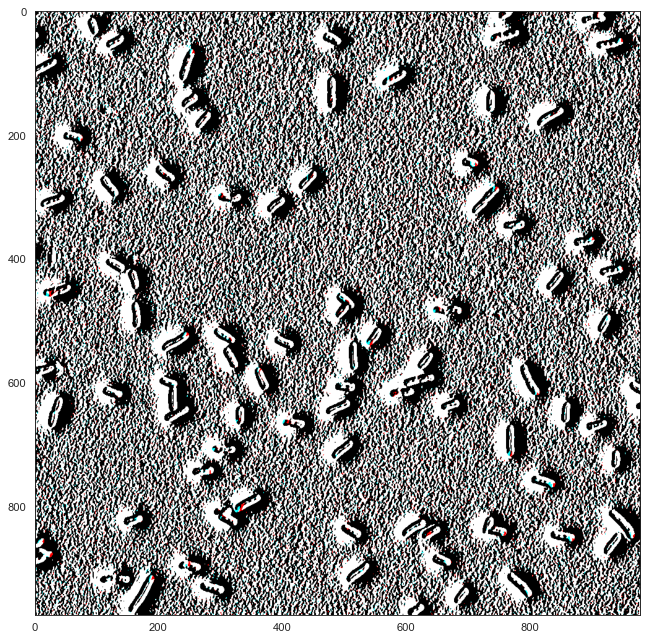

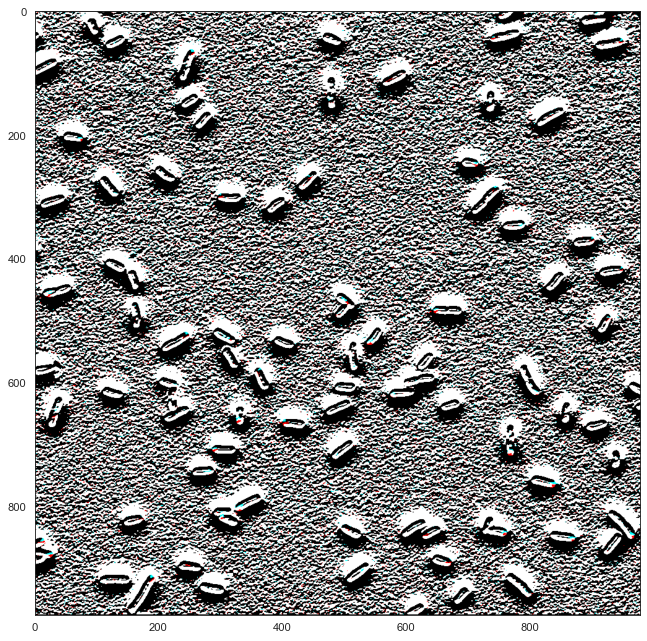

In [10]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobelx,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobely,cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


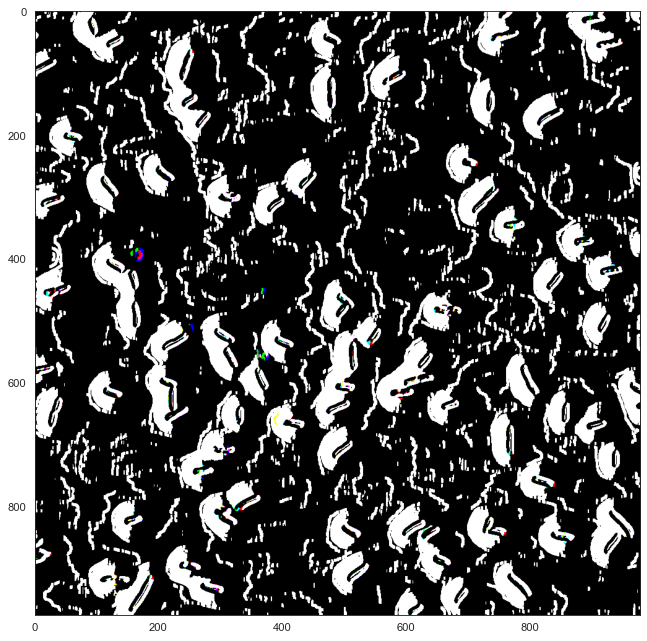

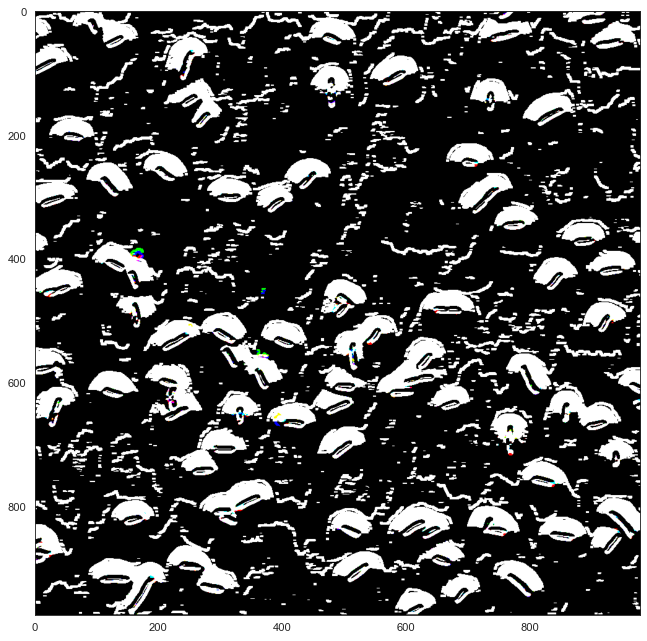

In [11]:
sobelx_dst = cv2.Sobel(dst,cv2.CV_64F,1,0,ksize=5)
sobely_dst = cv2.Sobel(dst,cv2.CV_64F,0,1,ksize=5)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobelx_dst,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(sobely_dst,cmap='gray')

# Thresholding

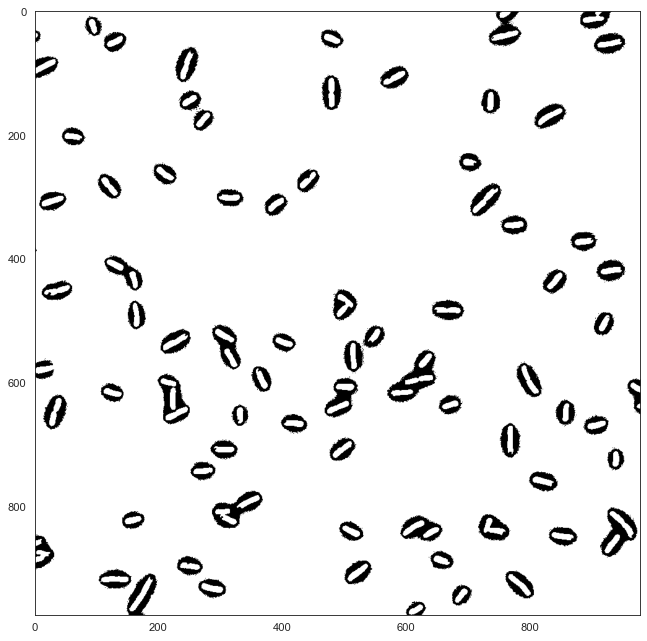

In [12]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
# fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
# plt.imshow(ret,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(thresh,cmap='gray')


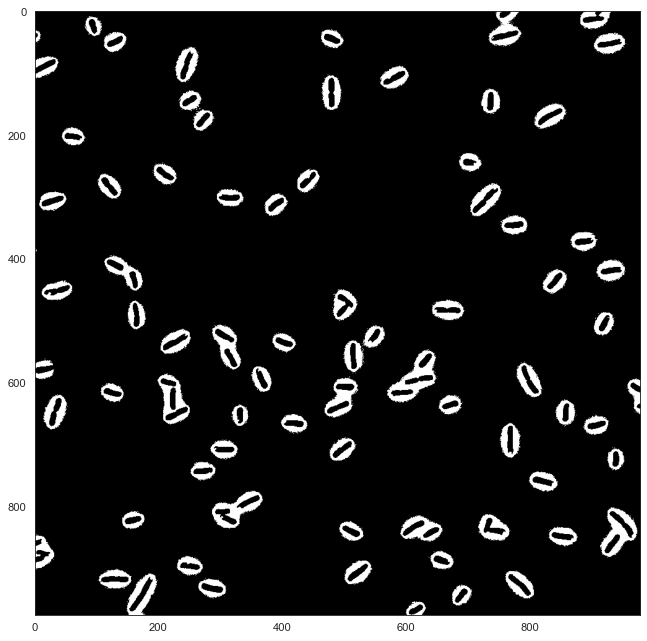

In [13]:
gray = cv2.cvtColor(1-img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
# fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
# plt.imshow(ret,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(thresh,cmap='gray')



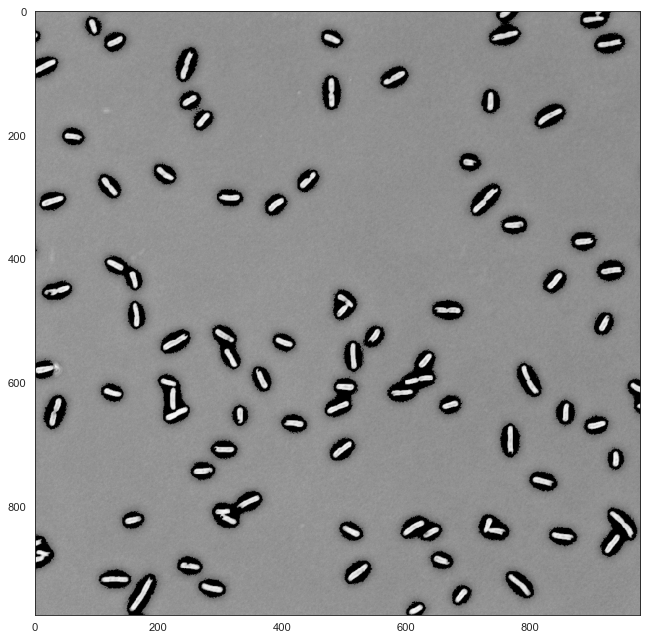

In [14]:
gray = cv2.cvtColor(1-img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_TOZERO+cv2.THRESH_OTSU)
# fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
# plt.imshow(ret,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(thresh,cmap='gray')

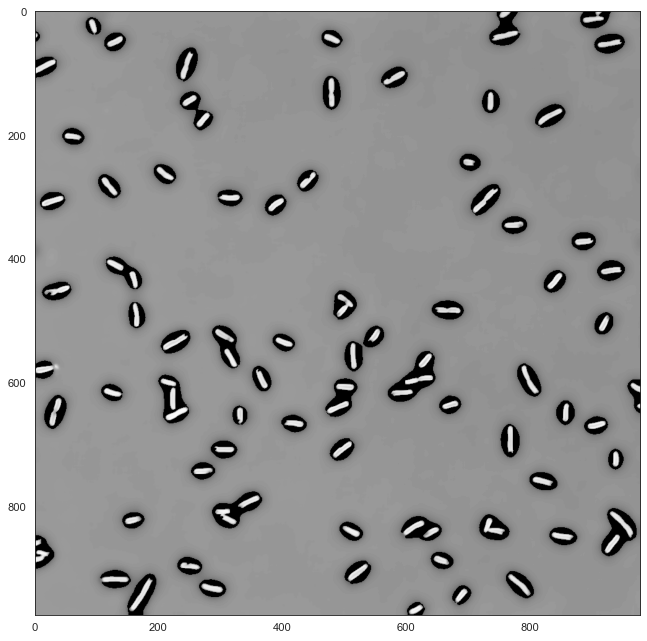

In [15]:
gray = cv2.cvtColor(1-dst,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_TOZERO+cv2.THRESH_OTSU)
# fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
# plt.imshow(ret,cmap='gray')
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.imshow(thresh,cmap='gray')

In [16]:
import scipy.misc
import scipy.ndimage
import skimage.filters
import sklearn.metrics



Text(0.5, 1.0, 'median filtered image')

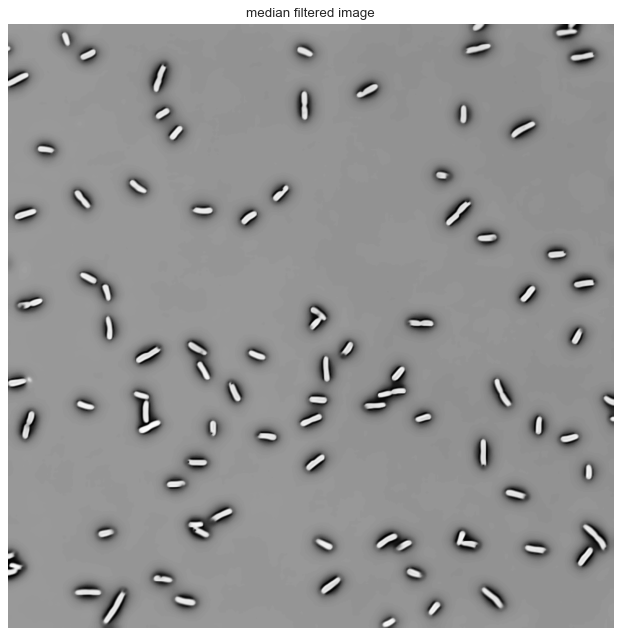

In [17]:
plt.ion()
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
median_filtered= scipy.ndimage.median_filter(gray, size=3)
plt.imshow(median_filtered, cmap='gray')
plt.axis('off')
plt.title('median filtered image')


skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


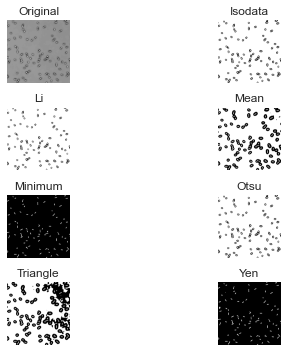

In [18]:
result_meadian = skimage.filters.thresholding.try_all_threshold(median_filtered)


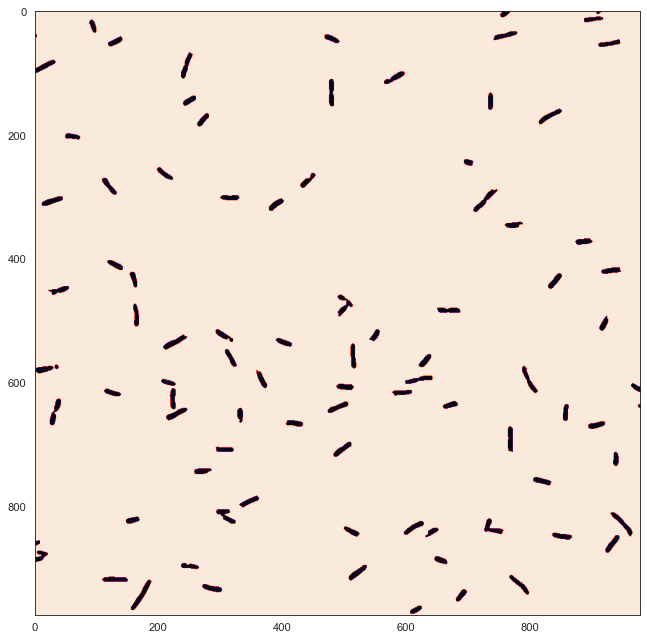

In [19]:
seg_median= skimage.filters.thresholding.threshold_minimum(median_filtered)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(median_filtered<seg_median)

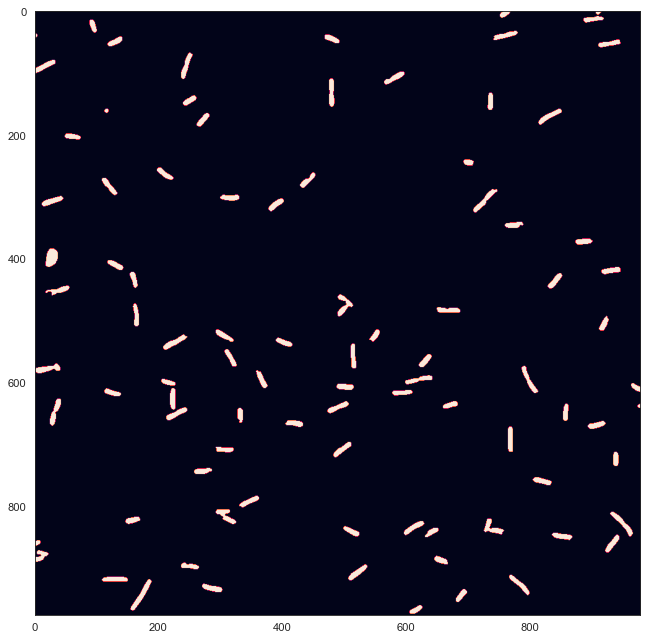

In [20]:
seg_med_yan= skimage.filters.thresholding.threshold_yen(median_filtered)
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(median_filtered>seg_med_yan)

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


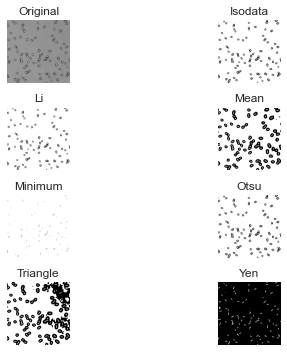

In [21]:
result_gray = skimage.filters.thresholding.try_all_threshold(gray)



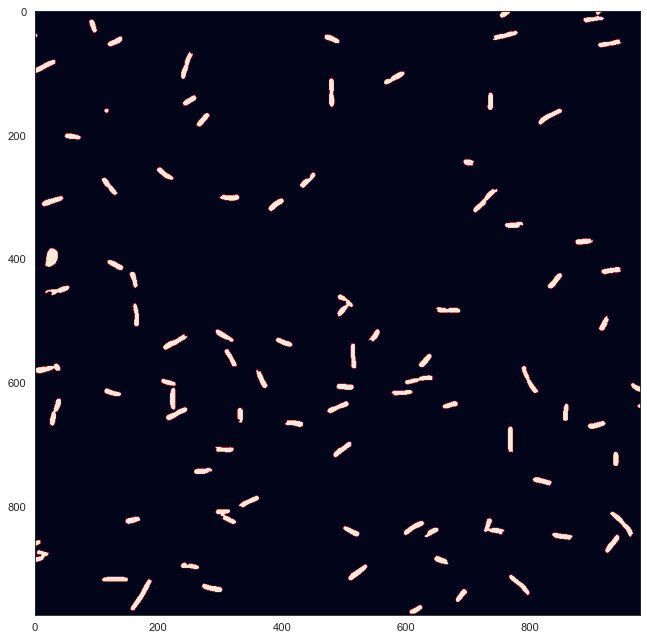

In [22]:
seg_gray_yan= skimage.filters.thresholding.threshold_yen(gray)

fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(gray>seg_med_yan)

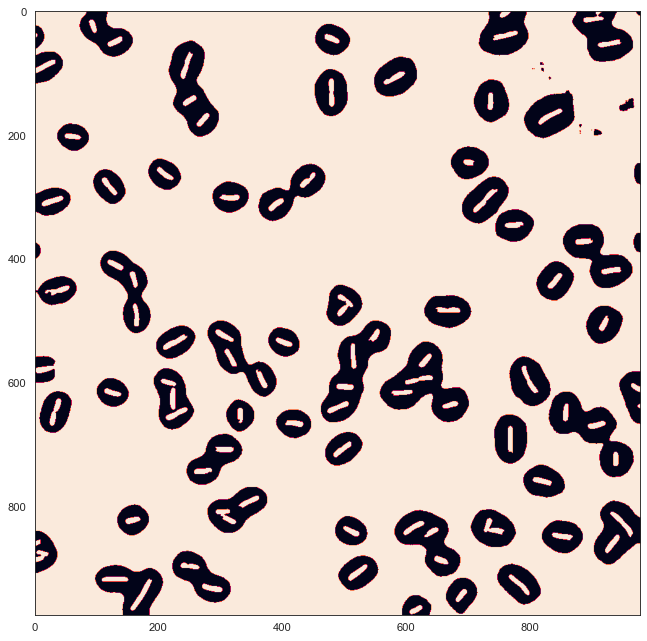

In [23]:
seg_gray_mean= skimage.filters.thresholding.threshold_mean(gray)

fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(1-(gray<seg_gray_mean))

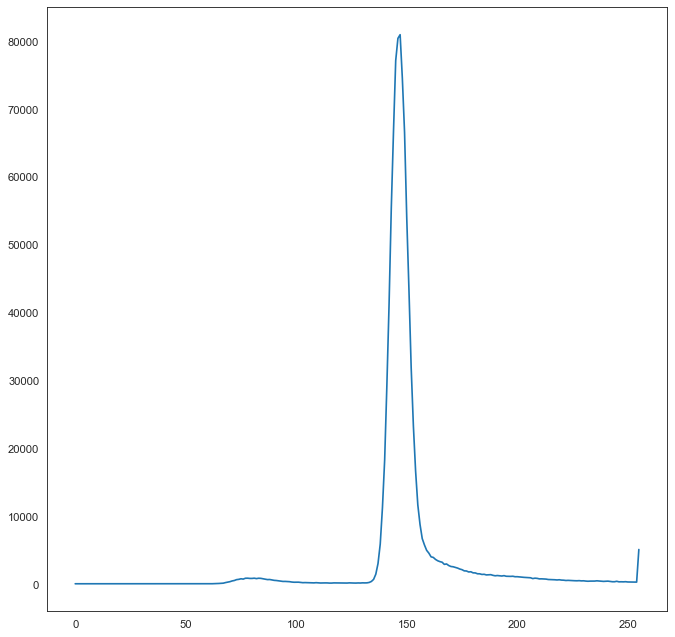

In [24]:

# find frequency of pixels in range 0-255 
histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

# show the plotting graph of an image 
plt.plot(histr) 
plt.show() 

(array([0.00000e+00, 0.00000e+00, 0.00000e+00, 3.07000e+02, 6.04000e+02,
        9.29000e+02, 4.97000e+02, 0.00000e+00, 1.16500e+03, 0.00000e+00,
        6.45000e+02, 3.70000e+02, 0.00000e+00, 9.51000e+02, 1.00000e+00,
        6.87000e+02, 2.40000e+02, 3.00000e+00, 9.75000e+02, 6.00000e+00,
        7.42000e+02, 2.37000e+02, 2.00000e+00, 9.19000e+02, 5.00000e+00,
        7.67000e+02, 1.98000e+02, 6.00000e+00, 9.52000e+02, 8.00000e+00,
        9.96000e+02, 5.00000e+00, 6.54000e+02, 4.15000e+02, 5.00000e+00,
        1.06200e+03, 1.10000e+01, 1.01200e+03, 1.67000e+02, 7.46000e+02,
        4.32000e+02, 1.60000e+01, 1.34700e+03, 2.60000e+01, 1.28000e+03,
        1.45000e+02, 1.09200e+03, 4.16000e+02, 1.70000e+01, 1.53600e+03,
        1.90000e+01, 1.67500e+03, 2.40000e+01, 1.72300e+03, 1.55000e+02,
        1.47700e+03, 3.98000e+02, 1.70000e+01, 1.95700e+03, 6.00000e+00,
        2.14500e+03, 7.00000e+00, 2.22600e+03, 6.00000e+00, 2.23100e+03,
        1.52000e+02, 2.43500e+03, 1.75000e+02, 2.37

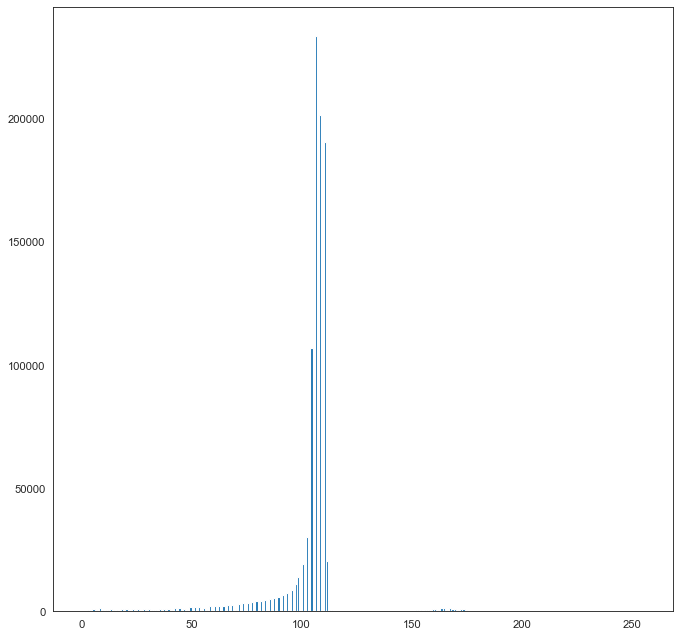

In [25]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')

plt.hist(gray.ravel(),256,[0,256]) 


In [26]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray.shape

(977, 979)

##### gray.max()

In [27]:
blur = cv2.GaussianBlur(gray,(5,5),0)

# find normalized_histogram, and its cumulative distribution function
hist = cv2.calcHist([blur],[0],None,[256],[0,256])
hist_norm = hist.ravel()/hist.max()
Q = hist_norm.cumsum()

bins = np.arange(256)

fn_min = np.inf
thresh = -1

for i in range(1,256):
    p1,p2 = np.hsplit(hist_norm,[i]) # probabilities
    q1,q2 = Q[i],Q[255]-Q[i] # cum sum of classes
    b1,b2 = np.hsplit(bins,[i]) # weights

    # finding means and variances
    m1,m2 = np.sum(p1*b1)/q1, np.sum(p2*b2)/q2
    v1,v2 = np.sum(((b1-m1)**2)*p1)/q1,np.sum(((b2-m2)**2)*p2)/q2

    # calculates the minimization function
    fn = v1*q1 + v2*q2
    if fn < fn_min:
        fn_min = fn
        thresh = i

thresh

179

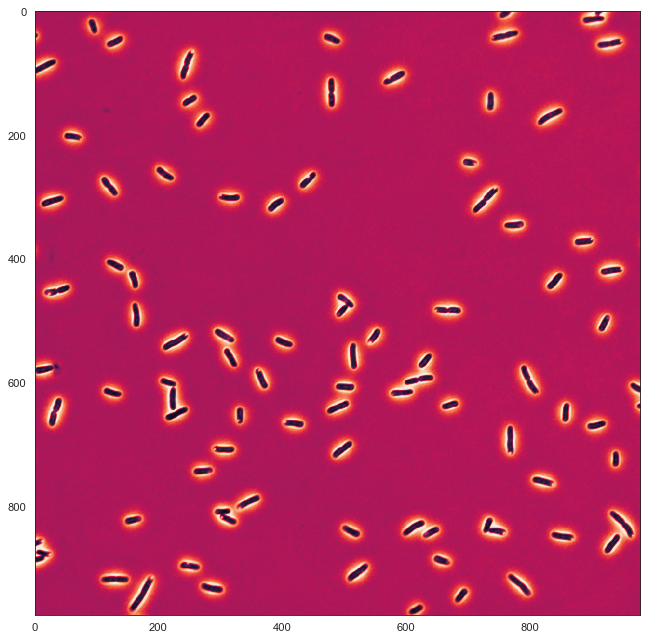

In [28]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(gray)

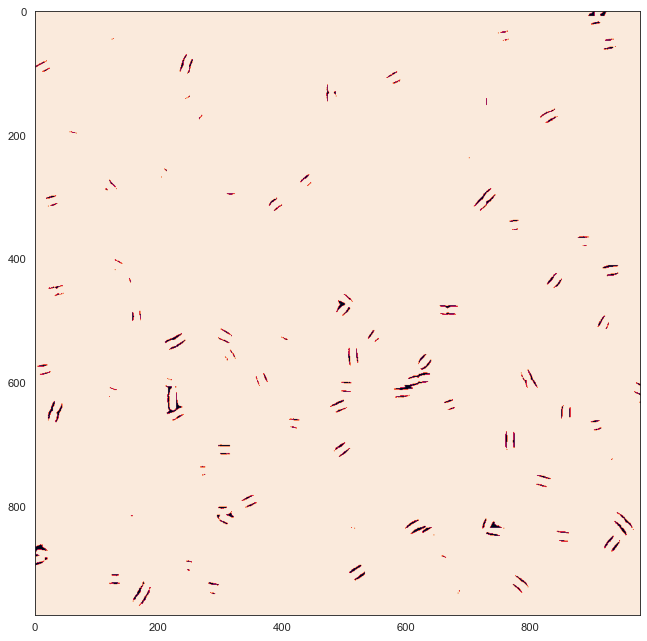

In [29]:
fig=plt.figure(figsize=(10, 10), dpi= 80, facecolor='w', edgecolor='k')
plt.imshow(gray<255)


Threshold value is 80


Text(0.5, 1.0, 'otsu predicted binary image')

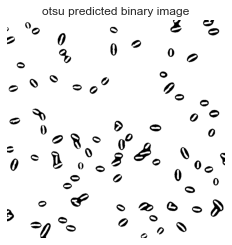

In [30]:
threshold = skimage.filters.threshold_otsu(median_filtered)
print('Threshold value is {}'.format(threshold))
predicted = np.uint8(median_filtered > threshold) * 255
plt.imshow(predicted, cmap='gray')
plt.axis('off')
plt.title('otsu predicted binary image')